<a href="https://colab.research.google.com/github/pranavkokati/ShapeFillingChallenge/blob/main/ShapeFillingChallenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python

In [ ]:
import numpy as np
import random
import cv2
import os
from pathlib import Path
from abc import ABC, abstractmethod
from typing import Tuple, List
from dataclasses import dataclass


@dataclass
class GenerationConfig:
    output_dir: str = "shape_dataset"
    image_size: Tuple[int, int] = (256, 256)
    num_samples: int = 5000 # Increased number of samples
    train_split: float = 0.8
    incomplete_probability: float = 0.2 # Doubled incomplete probability
    thickness_range: Tuple[int, int] = (2, 8) # Increased range for more variation
    margin_ratio: float = 0.15

class ShapeGenerator(ABC):
    def __init__(self, config: GenerationConfig):
        self.config = config
        self.width, self.height = config.image_size
        self.margin = int(min(self.width, self.height) * config.margin_ratio)

    @abstractmethod
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        pass

    def create_incomplete_version(self, complete_outline: np.ndarray) -> np.ndarray:
        contours, _ = cv2.findContours(complete_outline, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return complete_outline

        largest_contour = max(contours, key=cv2.contourArea)
        if len(largest_contour) < 10:
            return complete_outline

        # create gap of 40-60% of perimeter
        contour_points = largest_contour.reshape(-1, 2)
        perimeter_length = len(contour_points)

        # much larger gap remove almost half the shape
        gap_ratio = random.uniform(0.4, 0.6)
        gap_length = int(perimeter_length * gap_ratio)
        start_idx = random.randint(0, perimeter_length - gap_length)

        # create new contour without the large gap
        if start_idx + gap_length < perimeter_length:
            remaining_points = np.vstack([
                contour_points[:start_idx],
                contour_points[start_idx + gap_length:]
            ])
        else:
            remaining_points = contour_points[:start_idx]

        incomplete_outline = np.zeros_like(complete_outline)
        if len(remaining_points) > 1:
            thickness = random.randint(*self.config.thickness_range)
            cv2.polylines(incomplete_outline, [remaining_points.astype(np.int32)],
                         False, 255, thickness)

        return incomplete_outline


class LineGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # straight lines, curves, or zigzag patterns
        line_type = random.choice(['straight', 'curve', 'zigzag'])
        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)

        if line_type == 'straight':
            # random straight line
            x1 = random.randint(self.margin, self.width - self.margin)
            y1 = random.randint(self.margin, self.height - self.margin)
            x2 = random.randint(self.margin, self.width - self.margin)
            y2 = random.randint(self.margin, self.height - self.margin)
            cv2.line(outline, (x1, y1), (x2, y2), 255, thickness)

        elif line_type == 'curve':
            # smooth curve using multiple connected segments
            num_points = random.randint(4, 8)
            points = []
            for i in range(num_points):
                x = random.randint(self.margin, self.width - self.margin)
                y = random.randint(self.margin, self.height - self.margin)
                points.append([x, y])

            points = np.array(points, dtype=np.int32)
            cv2.polylines(outline, [points], False, 255, thickness)

        else:  # zigzag
            # create zigzag pattern
            start_x = random.randint(self.margin, self.width // 3)
            start_y = random.randint(self.margin, self.height - self.margin)

            points = [[start_x, start_y]]
            current_x, current_y = start_x, start_y

            for _ in range(random.randint(3, 6)):
                current_x += random.randint(30, 80)
                current_y += random.randint(-50, 50)
                current_x = min(current_x, self.width - self.margin)
                current_y = max(self.margin, min(current_y, self.height - self.margin))
                points.append([current_x, current_y])

            points = np.array(points, dtype=np.int32)
            cv2.polylines(outline, [points], False, 255, thickness)

        # for lines, the output should be the same as input (no filling)
        return outline, outline.copy()


class DotGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # small dots or clusters of dots
        dot_type = random.choice(['single', 'cluster', 'pattern'])

        outline = np.zeros(self.config.image_size, dtype=np.uint8)

        if dot_type == 'single':
            # single dot
            center_x = random.randint(self.margin, self.width - self.margin)
            center_y = random.randint(self.margin, self.height - self.margin)
            radius = random.randint(2, 8)
            cv2.circle(outline, (center_x, center_y), radius, 255, -1)

        elif dot_type == 'cluster':
            # cluster of dots
            cluster_center_x = random.randint(self.margin, self.width - self.margin)
            cluster_center_y = random.randint(self.margin, self.height - self.margin)
            num_dots = random.randint(3, 8)

            for _ in range(num_dots):
                offset_x = random.randint(-40, 40)
                offset_y = random.randint(-40, 40)
                dot_x = max(self.margin, min(cluster_center_x + offset_x, self.width - self.margin))
                dot_y = max(self.margin, min(cluster_center_y + offset_y, self.height - self.margin))
                radius = random.randint(2, 6)
                cv2.circle(outline, (dot_x, dot_y), radius, 255, -1)

        else:  # pattern
            # dots in a pattern (line or grid)
            if random.choice([True, False]):
                # dots in a line
                start_x = random.randint(self.margin, self.width - self.margin)
                start_y = random.randint(self.margin, self.height - self.margin)
                end_x = random.randint(self.margin, self.width - self.margin)
                end_y = random.randint(self.margin, self.height - self.margin)

                num_dots = random.randint(4, 8)
                for i in range(num_dots):
                    t = i / (num_dots - 1) if num_dots > 1 else 0
                    dot_x = int(start_x + t * (end_x - start_x))
                    dot_y = int(start_y + t * (end_y - end_y))
                    radius = random.randint(2, 5)
                    cv2.circle(outline, (dot_x, dot_y), radius, 255, -1)
            else:
                # small grid of dots
                grid_size = random.randint(2, 4)
                start_x = random.randint(self.margin, self.width - 100)
                start_y = random.randint(self.margin, self.height - 100)
                spacing = random.randint(20, 40)

                for i in range(grid_size):
                    for j in range(grid_size):
                        dot_x = start_x + i * spacing
                        dot_y = start_y + j * spacing
                        if dot_x < self.width - self.margin and dot_y < self.height - self.margin:
                            radius = random.randint(2, 5)
                            cv2.circle(outline, (dot_x, dot_y), radius, 255, -1)

        # for dots, output should be same as input (no filling)
        return outline, outline.copy()


class CurveGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # various types of open curves
        curve_type = random.choice(['spiral', 'wave', 'arc', 'freeform'])
        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)

        if curve_type == 'spiral':
            # create spiral curve
            center_x = self.width // 2
            center_y = self.height // 2
            max_radius = min(self.width, self.height) // 3

            points = []
            for i in range(0, 720, 10):  # two full rotations
                angle = np.radians(i)
                radius = (i / 720) * max_radius
                x = int(center_x + radius * np.cos(angle))
                y = int(center_y + radius * np.sin(angle))
                if self.margin <= x < self.width - self.margin and self.margin <= y < self.height - self.margin:
                    points.append([x, y])

            if len(points) > 1:
                points = np.array(points, dtype=np.int32)
                cv2.polylines(outline, [points], False, 255, thickness)

        elif curve_type == 'wave':
            # sine wave
            start_x = self.margin
            amplitude = random.randint(20, 60)
            frequency = random.uniform(0.02, 0.05)
            center_y = self.height // 2

            points = []
            for x in range(start_x, self.width - self.margin, 5):
                y = int(center_y + amplitude * np.sin(frequency * x))
                if self.margin <= y < self.height - self.margin:
                    points.append([x, y])

            if len(points) > 1:
                points = np.array(points, dtype=np.int32)
                cv2.polylines(outline, [points], False, 255, thickness)

        elif curve_type == 'arc':
            # partial circle arc
            center_x = random.randint(self.margin + 50, self.width - self.margin - 50)
            center_y = random.randint(self.margin + 50, self.height - self.margin - 50)
            radius = random.randint(30, min(self.width, self.height) // 4)

            start_angle = random.randint(0, 360)
            arc_length = random.randint(60, 180)  # partial arc only
            end_angle = start_angle + arc_length

            cv2.ellipse(outline, (center_x, center_y), (radius, radius), 0,
                       start_angle, end_angle, 255, thickness)

        else:  # freeform
            # random smooth curve
            num_control_points = random.randint(4, 7)
            points = []

            for i in range(num_control_points):
                x = random.randint(self.margin, self.width - self.margin)
                y = random.randint(self.margin, self.height - self.margin)
                points.append([x, y])

            # create smooth curve through control points
            points = np.array(points, dtype=np.int32)
            cv2.polylines(outline, [points], False, 255, thickness)

        # for curves, output should be same as input (no filling)
        return outline, outline.copy()


class CircleGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # ensure circle fits within image bounds
        max_radius = min(self.width, self.height) // 4
        radius = random.randint(30, max_radius)

        center_x = random.randint(radius + self.margin, self.width - radius - self.margin)
        center_y = random.randint(radius + self.margin, self.height - radius - self.margin)

        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)
        filled = np.zeros(self.config.image_size, dtype=np.uint8)

        cv2.circle(outline, (center_x, center_y), radius, 255, thickness)
        cv2.circle(filled, (center_x, center_y), radius, 255, -1)

        return outline, filled

    def create_incomplete_version(self, complete_outline: np.ndarray) -> np.ndarray:
        # for circles, draw only a portion (arc) instead of full circle
        contours, _ = cv2.findContours(complete_outline, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return complete_outline

        # get circle parameters
        (x, y), radius = cv2.minEnclosingCircle(contours[0])
        center = (int(x), int(y))
        radius = int(radius)

        incomplete_outline = np.zeros_like(complete_outline)
        thickness = random.randint(*self.config.thickness_range)

        # draw only part of the circle (remove 120-180 degrees)
        start_angle = random.randint(0, 360)
        arc_length = random.randint(180, 240)  # keep only 180-240 degrees
        end_angle = start_angle + arc_length

        cv2.ellipse(incomplete_outline, center, (radius, radius), 0,
                   start_angle, end_angle, 255, thickness)

        return incomplete_outline


class RectangleGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # generate rectangle coordinates with proper bounds
        min_size = 60
        x1 = random.randint(self.margin, self.width - min_size - self.margin)
        y1 = random.randint(self.margin, self.height - min_size - self.margin)
        x2 = random.randint(x1 + min_size, self.width - self.margin)
        y2 = random.randint(y1 + min_size, self.height - self.margin)

        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)
        filled = np.zeros(self.config.image_size, dtype=np.uint8)

        cv2.rectangle(outline, (x1, y1), (x2, y2), 255, thickness)
        cv2.rectangle(filled, (x1, y1), (x2, y2), 255, -1)

        return outline, filled

    def create_incomplete_version(self, complete_outline: np.ndarray) -> np.ndarray:
        # for rectangles, draw only 2-3 sides instead of all 4
        contours, _ = cv2.findContours(complete_outline, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return complete_outline

        # get bounding rectangle
        x, y, w, h = cv2.boundingRect(contours[0])

        incomplete_outline = np.zeros_like(complete_outline)
        thickness = random.randint(*self.config.thickness_range)

        # define the 4 sides
        sides = [
            [(x, y), (x + w, y)],           # top
            [(x + w, y), (x + w, y + h)],   # right
            [(x + w, y + h), (x, y + h)],   # bottom
            [(x, y + h), (x, y)]            # left
        ]

        # remove 1-2 sides randomly
        num_sides_to_remove = random.randint(1, 2)
        sides_to_keep = list(range(4))
        for _ in range(num_sides_to_remove):
            if sides_to_keep:
                sides_to_keep.remove(random.choice(sides_to_keep))

        # draw only the remaining sides
        for i in sides_to_keep:
            cv2.line(incomplete_outline, sides[i][0], sides[i][1], 255, thickness)

        return incomplete_outline


class EllipseGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        # create ellipse with safe bounds
        max_axis = min(self.width, self.height) // 4
        axes_a = random.randint(30, max_axis)
        axes_b = random.randint(30, max_axis)

        center_x = random.randint(axes_a + self.margin, self.width - axes_a - self.margin)
        center_y = random.randint(axes_b + self.margin, self.height - axes_b - self.margin)
        angle = random.randint(0, 180)

        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)
        filled = np.zeros(self.config.image_size, dtype=np.uint8)

        cv2.ellipse(outline, (center_x, center_y), (axes_a, axes_b), angle, 0, 360, 255, thickness)
        cv2.ellipse(filled, (center_x, center_y), (axes_a, axes_b), angle, 0, 360, 255, -1)

        return outline, filled

    def create_incomplete_version(self, complete_outline: np.ndarray) -> np.ndarray:
        # for ellipses, draw only an arc instead of full ellipse
        contours, _ = cv2.findContours(complete_outline, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return complete_outline

        # fit ellipse to contour
        if len(contours[0]) >= 5:
            ellipse = cv2.fitEllipse(contours[0])
            center, axes, angle = ellipse
        else:
            return complete_outline

        incomplete_outline = np.zeros_like(complete_outline)
        thickness = random.randint(*self.config.thickness_range)

        # draw only part of the ellipse
        start_angle = random.randint(0, 360)
        arc_length = random.randint(180, 240)
        end_angle = start_angle + arc_length

        cv2.ellipse(incomplete_outline, (int(center[0]), int(center[1])),
                   (int(axes[0]/2), int(axes[1]/2)), angle,
                   start_angle, end_angle, 255, thickness)

        return incomplete_outline


class PolygonGenerator(ShapeGenerator):
    def generate_complete(self) -> Tuple[np.ndarray, np.ndarray]:
        num_vertices = random.randint(5, 8)

        # calculate safe center and radius
        max_radius = min(self.width, self.height) // 5
        base_radius = random.randint(40, max_radius)

        center_x = random.randint(base_radius + self.margin, self.width - base_radius - self.margin)
        center_y = random.randint(base_radius + self.margin, self.height - base_radius - self.margin)

        vertices = []
        for i in range(num_vertices):
            angle = 2 * np.pi * i / num_vertices + random.uniform(-0.2, 0.2)
            radius = base_radius + random.randint(-10, 10)
            x = int(center_x + radius * np.cos(angle))
            y = int(center_y + radius * np.sin(angle))
            vertices.append([x, y])

        vertices = np.array(vertices, dtype=np.int32)
        thickness = random.randint(*self.config.thickness_range)

        outline = np.zeros(self.config.image_size, dtype=np.uint8)
        filled = np.zeros(self.config.image_size, dtype=np.uint8)

        cv2.polylines(outline, [vertices], True, 255, thickness)
        cv2.fillPoly(filled, [vertices], 255)

        return outline, filled

    def create_incomplete_version(self, complete_outline: np.ndarray) -> np.ndarray:
        # for polygons, draw only some edges instead of all
        contours, _ = cv2.findContours(complete_outline, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            return complete_outline

        # approximate polygon
        epsilon = 0.02 * cv2.arcLength(contours[0], True)
        approx = cv2.approxPolyDP(contours[0], epsilon, True)
        vertices = approx.reshape(-1, 2)

        if len(vertices) < 3:
            return complete_outline

        incomplete_outline = np.zeros_like(complete_outline)
        thickness = random.randint(*self.config.thickness_range)

        # remove 1-3 edges randomly
        num_edges = len(vertices)
        num_edges_to_remove = random.randint(1, min(3, num_edges - 2))
        edges_to_keep = list(range(num_edges))

        for _ in range(num_edges_to_remove):
            if edges_to_keep:
                edges_to_keep.remove(random.choice(edges_to_keep))

        # draw only the remaining edges
        for i in edges_to_keep:
            start_point = tuple(vertices[i])
            end_point = tuple(vertices[(i + 1) % num_edges])
            cv2.line(incomplete_outline, start_point, end_point, 255, thickness)

        return incomplete_outline


class DatasetManager:
    def __init__(self, config: GenerationConfig):
        self.config = config
        self.output_path = Path(config.output_dir)
        self._create_directory_structure()

        # remove individual generators from self.generators since we handle them separately
        self.closed_generators = [
            CircleGenerator(config),
            RectangleGenerator(config),
            EllipseGenerator(config),
            PolygonGenerator(config)
        ]

        self.non_closed_generators = [
            LineGenerator(config),
            DotGenerator(config),
            CurveGenerator(config)
        ]


    def _create_directory_structure(self):
        directories = [
            self.output_path / "train" / "outlines",
            self.output_path / "train" / "filled",
            self.output_path / "test" / "outlines",
            self.output_path / "test" / "filled"
        ]

        for directory in directories:
            directory.mkdir(parents=True, exist_ok=True)

    def _generate_sample(self) -> Tuple[np.ndarray, np.ndarray]:
        # first decide: closed shape or non-closed shape
        generate_non_closed = random.random() < 0.1  # 15% non-closed shapes

        if generate_non_closed:
            # generate inherently non-closed shapes (lines, dots, curves)
            generator = random.choice(self.non_closed_generators)
            return generator.generate_complete()  # these always return same input/output
        else:
            # generate closed shapes (circles, rectangles, etc.)
            generator = random.choice(self.closed_generators)
            outline, filled = generator.generate_complete()

            # small chance to make closed shape incomplete
            if random.random() < self.config.incomplete_probability:  # Use the config value
                incomplete_outline = generator.create_incomplete_version(outline)
                return incomplete_outline, incomplete_outline

            return outline, filled


    def generate_dataset(self):
        num_train = int(self.config.num_samples * self.config.train_split)
        num_test = self.config.num_samples - num_train

        stats = {"complete": 0, "incomplete": 0}

        # generate training data
        for i in range(num_train):
            outline, filled = self._generate_sample()

            if np.array_equal(outline, filled):
                stats["incomplete"] += 1
            else:
                stats["complete"] += 1


            filename = f"shape_{i:06d}.png"
            cv2.imwrite(str(self.output_path / "train" / "outlines" / filename), outline)
            cv2.imwrite(str(self.output_path / "train" / "filled" / filename), filled)

        # generate test data
        for i in range(num_test):
            outline, filled = self._generate_sample()

            if np.array_equal(outline, filled):
                stats["incomplete"] += 1
            else:
                stats["complete"] += 1


            filename = f"shape_{num_train + i:06d}.png"
            cv2.imwrite(str(self.output_path / "test" / "outlines" / filename), outline)
            cv2.imwrite(str(self.output_path / "test" / "filled" / filename), filled)


        print(f"generated {self.config.num_samples} samples")
        print(f"complete: {stats['complete']}, incomplete: {stats['incomplete']}")



def main():
    config = GenerationConfig(
        output_dir="shape_dataset",
        image_size=(256, 256),
        num_samples=5000, # Increased number of samples
        train_split=0.8,
        incomplete_probability=0.2,  # Doubled incomplete probability
        thickness_range=(2, 8),  # Increased range here
        margin_ratio=0.15
    )

    manager = DatasetManager(config)
    manager.generate_dataset()


if __name__ == "__main__":
    main()

generated 5000 samples
complete: 3601, incomplete: 1399


Using device: cuda
Found 4000 image pairs
Found 1400 image pairs
Starting training for 20 epochs...
Training samples: 4000
Validation samples: 1400


Epoch 1/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 65.52it/s]


Epoch 1/20
Train Loss: 0.5932 | Val Loss: 0.4855
New best model saved! Val Loss: 0.4855


Epoch 2/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.28it/s]


Epoch 2/20
Train Loss: 0.4352 | Val Loss: 0.3523
New best model saved! Val Loss: 0.3523


Epoch 3/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 64.97it/s]


Epoch 3/20
Train Loss: 0.3202 | Val Loss: 0.2428
New best model saved! Val Loss: 0.2428


Epoch 4/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 68.08it/s]


Epoch 4/20
Train Loss: 0.2351 | Val Loss: 0.1648
New best model saved! Val Loss: 0.1648


Epoch 5/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 66.59it/s]


Epoch 5/20
Train Loss: 0.1762 | Val Loss: 0.1074
New best model saved! Val Loss: 0.1074


Epoch 6/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 61.10it/s]


Epoch 6/20
Train Loss: 0.1421 | Val Loss: 0.0802
New best model saved! Val Loss: 0.0802


Epoch 7/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.33it/s]


Epoch 7/20
Train Loss: 0.1161 | Val Loss: 0.0662
New best model saved! Val Loss: 0.0662


Epoch 8/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.92it/s]


Epoch 8/20
Train Loss: 0.0950 | Val Loss: 0.0532
New best model saved! Val Loss: 0.0532


Epoch 9/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 57.02it/s]


Epoch 9/20
Train Loss: 0.0770 | Val Loss: 0.0397
New best model saved! Val Loss: 0.0397


Epoch 10/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 68.14it/s]


Epoch 10/20
Train Loss: 0.0692 | Val Loss: 0.0329
New best model saved! Val Loss: 0.0329


Epoch 11/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 66.08it/s]


Epoch 11/20
Train Loss: 0.0584 | Val Loss: 0.0265
New best model saved! Val Loss: 0.0265


Epoch 12/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 61.90it/s]


Epoch 12/20
Train Loss: 0.0545 | Val Loss: 0.0227
New best model saved! Val Loss: 0.0227


Epoch 13/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.66it/s]


Epoch 13/20
Train Loss: 0.0516 | Val Loss: 0.0194
New best model saved! Val Loss: 0.0194


Epoch 14/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 68.23it/s]


Epoch 14/20
Train Loss: 0.0449 | Val Loss: 0.0178
New best model saved! Val Loss: 0.0178


Epoch 15/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 58.77it/s]


Epoch 15/20
Train Loss: 0.0463 | Val Loss: 0.0157
New best model saved! Val Loss: 0.0157


Epoch 16/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.56it/s]


Epoch 16/20
Train Loss: 0.0388 | Val Loss: 0.0162


Epoch 17/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 66.80it/s]


Epoch 17/20
Train Loss: 0.0381 | Val Loss: 0.0144
New best model saved! Val Loss: 0.0144


Epoch 18/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 60.56it/s]


Epoch 18/20
Train Loss: 0.0392 | Val Loss: 0.0130
New best model saved! Val Loss: 0.0130


Epoch 19/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 67.55it/s]


Epoch 19/20
Train Loss: 0.0367 | Val Loss: 0.0135


Epoch 20/20 - Validation: 100%|██████████| 88/88 [00:01<00:00, 65.81it/s]


Epoch 20/20
Train Loss: 0.0342 | Val Loss: 0.0119
New best model saved! Val Loss: 0.0119


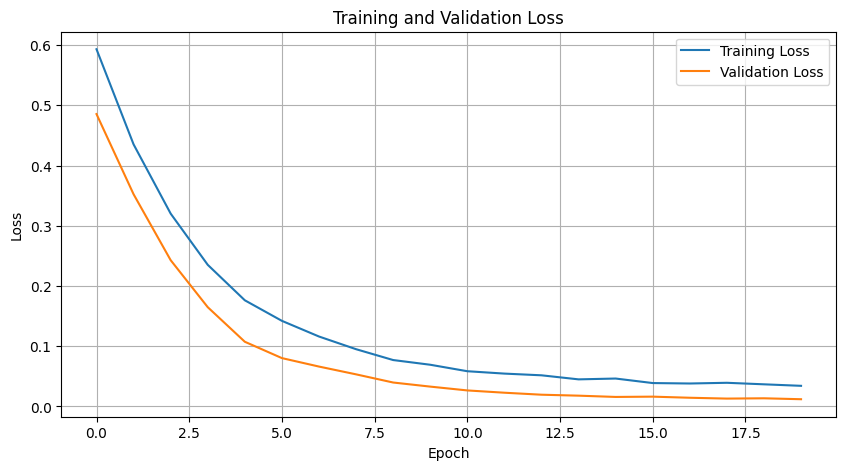

Training completed
Best validation loss: 0.0119
Model saved as 'best_model.pth'
Training curves saved as 'training_curves.png'

running prediction on images in shape_dataset/test/outlines...
Processing 1400 images from shape_dataset/test/outlines...


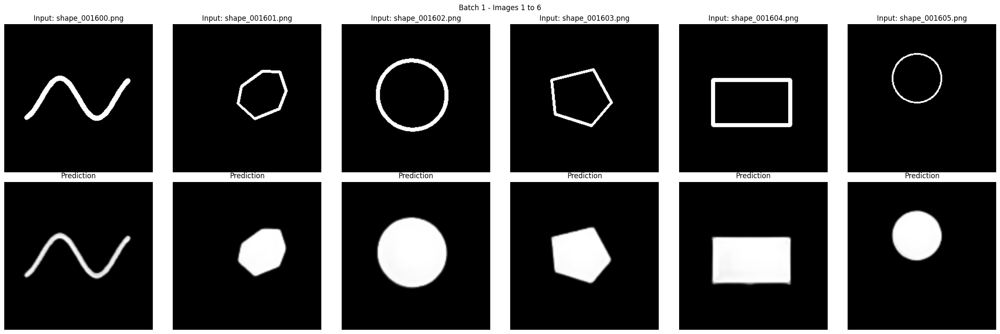

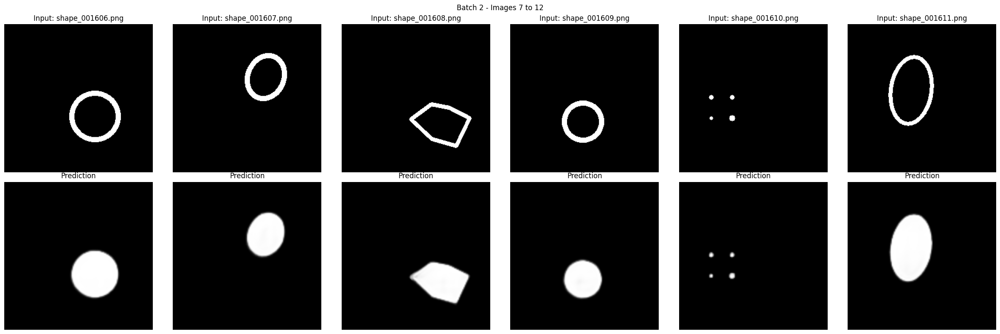

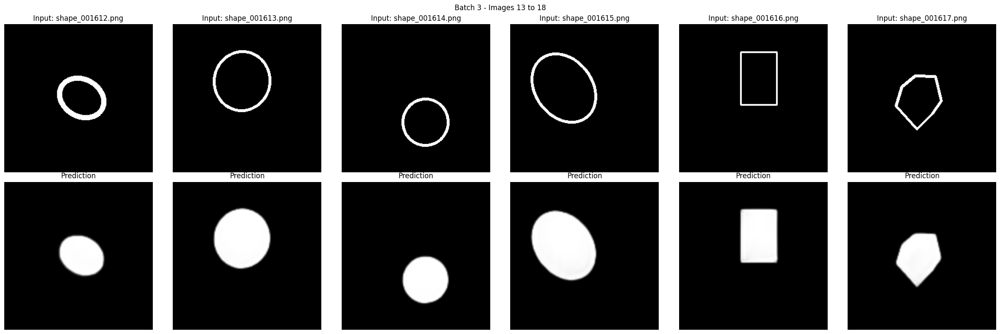

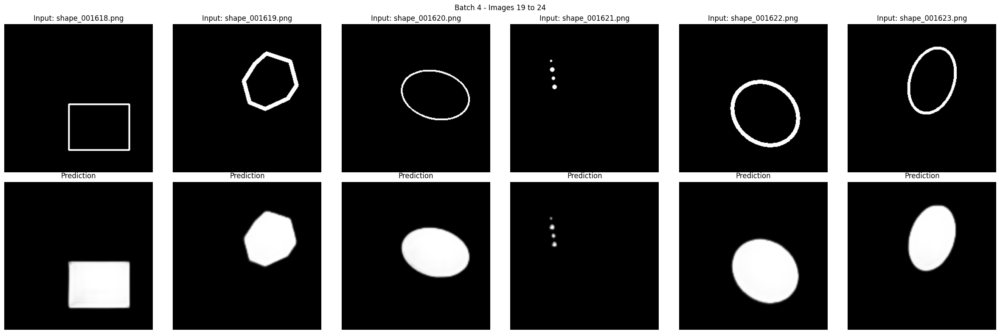

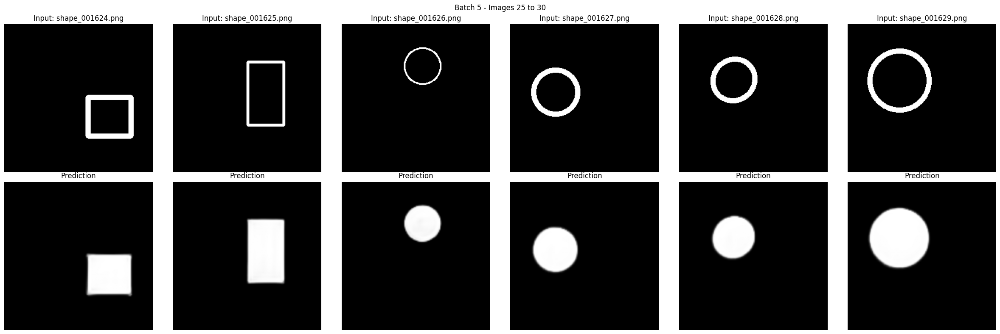

...

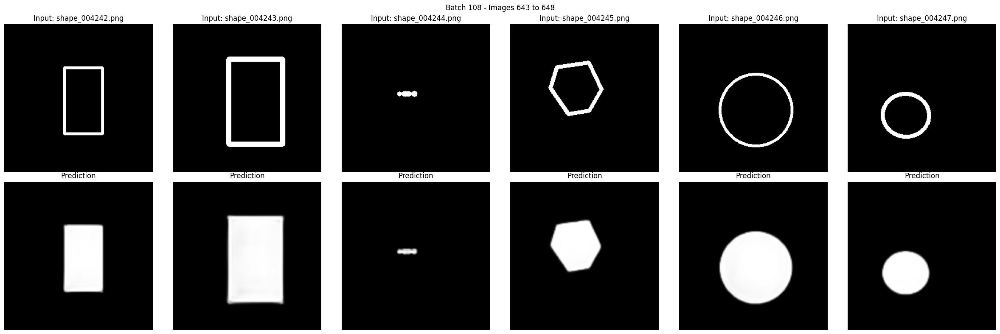

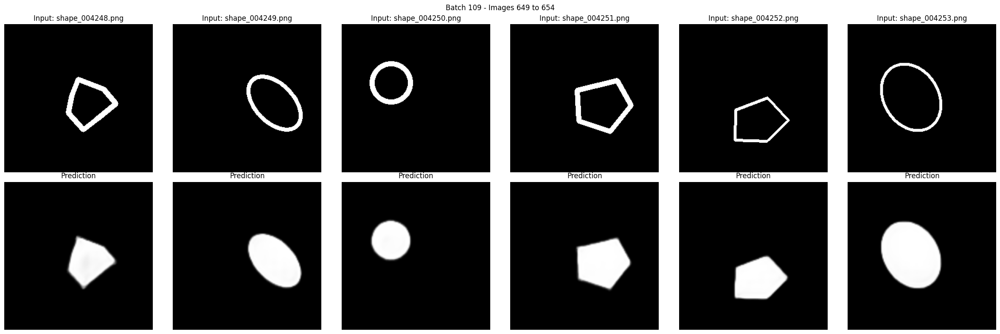

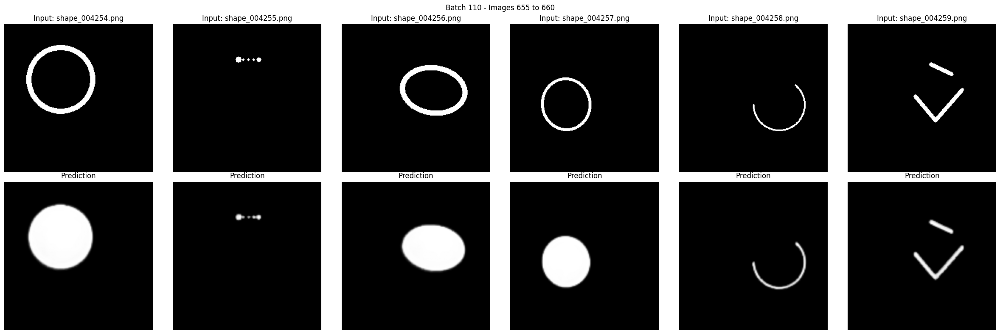

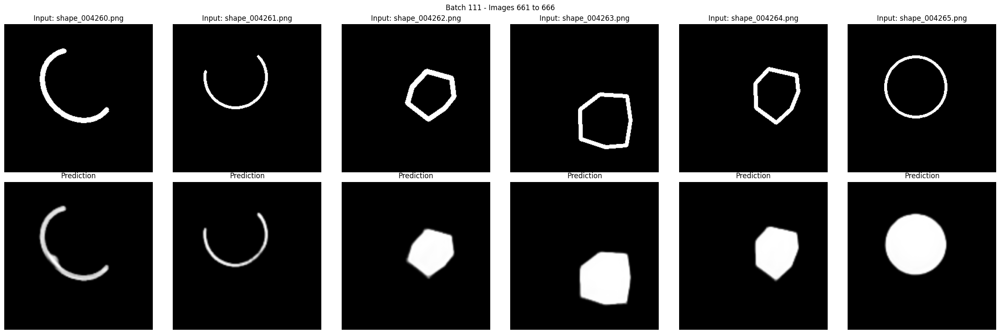

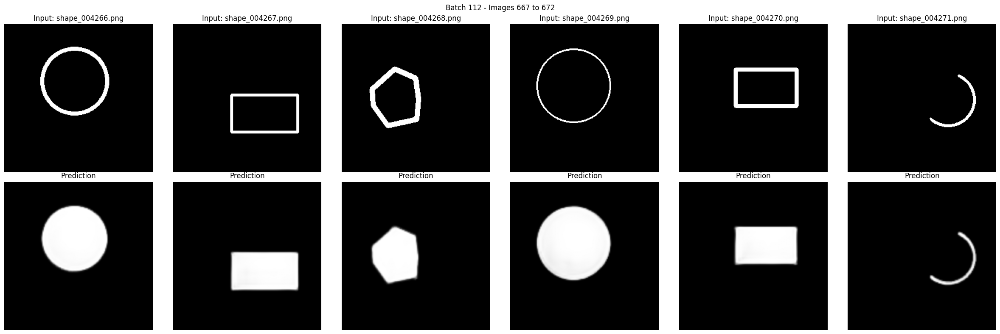

KeyboardInterrupt: 

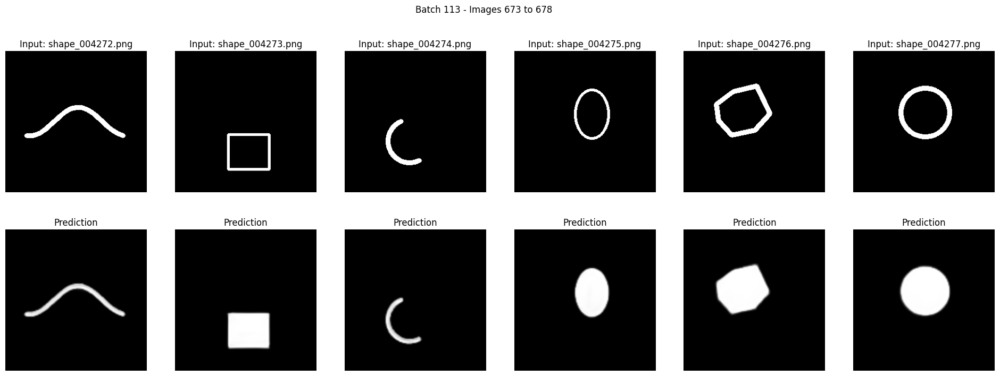

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm

class ShapeDataset(Dataset):

    def __init__(self, outline_folder, filled_folder):
        self.outline_folder = Path(outline_folder)
        self.filled_folder = Path(filled_folder)

        # Get all image files
        self.image_names = [f for f in os.listdir(outline_folder)
                           if f.endswith('.png')]
        print(f"Found {len(self.image_names)} image pairs")

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        # load images
        outline_path = self.outline_folder / self.image_names[idx]
        filled_path = self.filled_folder / self.image_names[idx]

        # make grayscale
        outline = cv2.imread(str(outline_path), cv2.IMREAD_GRAYSCALE)
        filled = cv2.imread(str(filled_path), cv2.IMREAD_GRAYSCALE)

        # resize to 256x256 for faster training
        outline = cv2.resize(outline, (128 , 128))
        filled = cv2.resize(filled, (128, 128))

        # data augmentation (50% chance each)
        if np.random.random() > 0.5:  # Horizontal flip
            outline = np.fliplr(outline).copy()
            filled = np.fliplr(filled).copy()

        if np.random.random() > 0.5:  # Vertical flip
            outline = np.flipud(outline).copy()
            filled = np.flipud(filled).copy()

        # convert to float and normalize to 0-1
        outline = outline.astype(np.float32) / 255.0
        filled = filled.astype(np.float32) / 255.0

        # convert to tensors and add channel dimension
        outline = torch.from_numpy(outline).unsqueeze(0)  # Shape: (1, 64, 64)
        filled = torch.from_numpy(filled).unsqueeze(0)

        return outline, filled

class UNet(nn.Module):

    def __init__(self):
        super(UNet, self).__init__()

        #Encoder
        self.enc1 = self.conv_block(1, 8)     # 64x64 -> 64x64
        self.enc2 = self.conv_block(8, 16)    # 32x32 -> 32x32
        self.enc3 = self.conv_block(16, 32)   # 16x16 -> 16x16

        # Bottleneck
        self.bottleneck = self.conv_block(32, 64)   # 8x8 -> 8x8

        # Decoder
        self.dec3 = self.conv_block(64 + 32, 32)    # 16x16
        self.dec2 = self.conv_block(32 + 16, 16)    # 32x32
        self.dec1 = self.conv_block(16 + 8, 8)      # 64x64

        # output layer
        self.final = nn.Conv2d(8, 1, kernel_size=1)

        # pooling and upsampling
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.2)
        )

    def forward(self, x):
        # Encoder path
        enc1 = self.enc1(x)      # 64x64
        enc1_pool = self.pool(enc1)  # 32x32

        enc2 = self.enc2(enc1_pool)  # 32x32
        enc2_pool = self.pool(enc2)  # 16x16

        enc3 = self.enc3(enc2_pool)  # 16x16
        enc3_pool = self.pool(enc3)  # 8x8

        # Bottleneck
        bottleneck = self.bottleneck(enc3_pool)  # 8x8

        # Decoder path
        dec3_up = self.upsample(bottleneck)  # 16x16
        dec3 = self.dec3(torch.cat([dec3_up, enc3], dim=1))

        dec2_up = self.upsample(dec3)  # 32x32
        dec2 = self.dec2(torch.cat([dec2_up, enc2], dim=1))

        dec1_up = self.upsample(dec2)  # 64x64
        dec1 = self.dec1(torch.cat([dec1_up, enc1], dim=1))

        # Final output
        output = self.final(dec1)
        return output

def train_model():

    # Setup
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Data folders - adjust these paths to your dataset
    train_outline_dir = 'shape_dataset/train/outlines'
    train_filled_dir = 'shape_dataset/train/filled'
    test_outline_dir = 'shape_dataset/test/outlines'
    test_filled_dir = 'shape_dataset/test/filled'

    # Create datasets
    train_dataset = ShapeDataset(train_outline_dir, train_filled_dir)
    val_dataset = ShapeDataset(test_outline_dir, test_filled_dir)

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

    # Create model
    model = UNet().to(device)

    # Loss and optimizer with stronger regularization
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0005, weight_decay=5e-4)  # Lower LR, higher weight decay

    # learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.3, patience=2)

    # Training settings
    num_epochs = 20
    best_val_loss = float('inf')
    train_losses = []
    val_losses = []
    patience_counter = 0  # For early stopping
    max_patience = 3  # More aggressive early stopping (was 5)

    print(f"Starting training for {num_epochs} epochs...")
    print(f"Training samples: {len(train_dataset)}")
    print(f"Validation samples: {len(val_dataset)}")

    for epoch in range(num_epochs):
        # training
        model.train()
        train_loss = 0

        for batch_idx, (inputs, targets) in enumerate(tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Training')):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            # Backward pass
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        # validation phase
        model.eval()
        val_loss = 0

        with torch.no_grad():
            for inputs, targets in tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Validation'):
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()

        # Calculate average losses
        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss = val_loss / len(val_loader)

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

        print(f"Epoch {epoch+1}/{num_epochs}")
        print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

        # Save best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"New best model saved! Val Loss: {avg_val_loss:.4f}")
            patience_counter = 0  # Reset patience counter
        else:
            patience_counter += 1

        # update learning rate based on validation loss
        scheduler.step(avg_val_loss)

        # Early stopping check
        if patience_counter >= max_patience:
            print(f"Early stopping triggered! No improvement for {max_patience} epochs.")
            break

    # Plot training curves
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.savefig('training_curves.png')
    plt.show()

    print("Training completed")
    print(f"Best validation loss: {best_val_loss:.4f}")
    print("Model saved as 'best_model.pth'")
    print("Training curves saved as 'training_curves.png'")


def test_model(model_path='best_model.pth'):

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Load model
    model = UNet().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Load test data
    test_outline_dir = 'shape_dataset/test/outlines'
    test_filled_dir = 'shape_dataset/test/filled'
    test_dataset = ShapeDataset(test_outline_dir, test_filled_dir)

    # Test on a few examples
    with torch.no_grad():
        for i in range(min(5, len(test_dataset))):
            outline, target = test_dataset[i]
            outline = outline.unsqueeze(0).to(device)  # Add batch dimension

            # Predict
            prediction = model(outline)
            prediction = torch.sigmoid(prediction)  # Convert to probabilities

            # Convert to numpy for visualization
            outline_np = outline.squeeze().cpu().numpy()
            target_np = target.squeeze().numpy()
            prediction_np = prediction.squeeze().cpu().numpy()

            # Plot results
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(outline_np, cmap='gray')
            plt.title('Input Outline')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(target_np, cmap='gray')
            plt.title('Target Filled')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(prediction_np, cmap='gray')
            plt.title('Model Prediction')
            plt.axis('off')
            plt.tight_layout()
            plt.savefig(f'test_result_{i+1}.png')
            plt.show()


def testing_on_folder(input_folder, model_path='best_model.pth', image_size=(128, 128), save_predictions=True):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Load model
    model = UNet().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    input_dir = Path(input_folder)
    if not input_dir.exists():
        print(f"Error: Input folder not found: {input_folder}")
        return

    image_files = sorted([f for f in input_dir.iterdir()
                           if f.suffix.lower() in ['.png', '.jpg', '.jpeg']])

    if not image_files:
        print(f"No images found in {input_folder}")
        return

    print(f"Processing {len(image_files)} images from {input_folder}...")

    # Create output directory for predictions
    if save_predictions:
        output_dir = Path('predictions')
        output_dir.mkdir(exist_ok=True)

    # Process images in batches for visualization
    batch_size = 6  # Show 6 images at a time

    with torch.no_grad():
        for batch_start in range(0, len(image_files), batch_size):
            batch_end = min(batch_start + batch_size, len(image_files))
            batch_files = image_files[batch_start:batch_end]

            # Create figure for this batch
            fig, axes = plt.subplots(2, len(batch_files), figsize=(4*len(batch_files), 8))
            if len(batch_files) == 1:
                axes = axes.reshape(2, 1)

            for i, image_path in enumerate(batch_files):
                # Load and process image
                original_img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

                if original_img is None:
                    print(f"Warning: Could not read image {image_path}. Skipping.")
                    continue

                # Resize for model input
                input_img_resized = cv2.resize(original_img, image_size)
                input_tensor = torch.from_numpy(input_img_resized.astype(np.float32) / 255.0).unsqueeze(0).unsqueeze(0).to(device)

                # Make prediction
                prediction = model(input_tensor)
                prediction = torch.sigmoid(prediction)
                prediction_np = prediction.squeeze().cpu().numpy()

                # Resize prediction back to original size
                original_size = original_img.shape
                prediction_display = cv2.resize(prediction_np, (original_size[1], original_size[0]))

                # Display in subplot
                axes[0, i].imshow(original_img, cmap='gray')
                axes[0, i].set_title(f'Input: {image_path.name}')
                axes[0, i].axis('off')

                axes[1, i].imshow(prediction_display, cmap='gray')
                axes[1, i].set_title('Prediction')
                axes[1, i].axis('off')

                # Save individual prediction if requested
                if save_predictions:
                    pred_path = output_dir / f'pred_{image_path.name}'
                    cv2.imwrite(str(pred_path), (prediction_display * 255).astype(np.uint8))

            plt.suptitle(f'Batch {batch_start//batch_size + 1} - Images {batch_start+1} to {batch_end}')
            plt.tight_layout()
            plt.savefig(f'batch_predictions_{batch_start//batch_size + 1}.png', dpi=150, bbox_inches='tight')
            plt.show()

    if save_predictions:
        print(f"Individual predictions saved to: {output_dir}")
    print("Batch prediction process finished")

if __name__ == "__main__":
    # Train the model
    train_model()

    input_folder_path = 'shape_dataset/test/outlines'

    print(f"\nrunning prediction on images in {input_folder_path}...")
    testing_on_folder(input_folder_path)